In [73]:
# Import packages
import pandas as pd
import numpy as np
import geopandas as gpd
import shapely as sp
from shapely import wkt
import fiona as fi
import pyproj
import math
from pygeoif import geometry

# Visualization
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import matplotlib.font_manager as font_manager

In [2]:
# Setup crs
crs = {'init': 'epsg:4326'}
amersfoort = {'init': 'epsg:28992'}

# Set up table visuals
pd.set_option("display.max_columns", 100)

In [76]:
# Visualisation
osfont = font_manager.FontProperties(family='Open Sans',
                                   style='normal', size=60)

In [3]:
# Load real estate database and buurt database
df_real_estate = pd.read_csv("Data/real_estate_upd_unf.csv", sep=",", dtype=str)
df_buurt = pd.read_csv("Data/buurt.csv", sep=";", 
                       usecols=['OBJECTNUMMER', 'Buurt', 'Buurt_code', 'Buurtcombinatie_code', 'Stadsdeel_code', 'Opp_m2', 'WKT_LNG_LAT'])
df_stadsdeel = pd.read_csv("Data/stadsdeel.csv", sep=";",
                       usecols=['OBJECTNUMMER', 'Stadsdeel', 'WKT_LNG_LAT'])

In [4]:
df_real_estate.columns.values

array(['perceelid', 'perceeltype', 'huisnr', 'huisnr_bag_letter',
       'huisnr_bag_toevoeging', 'bag_nummeraanduidingid',
       'bag_adresseerbaarobjectid', 'breedtegraad', 'lengtegraad', 'rdx',
       'rdy', 'oppervlakte', 'gebruiksdoel', 'reeksid', 'wijkcode',
       'lettercombinatie', 'huisnr_van', 'huisnr_tm', 'reeksindicatie',
       'straatid', 'straatnaam', 'straatnaam_nen', 'plaatsid',
       'plaatsnaam', 'plaatsnaam_nen', 'plaatscode', 'gemeenteid',
       'gemeentenaam', 'gemeentenaam_nen', 'gemeentecode', 'cebucocode',
       'provinciecode', 'provincienaam', 'cadastral_parcel_number',
       'energy_label', 'energy_certificate', 'energy_certificate_type',
       'energy_consumption', 'parcel_surface', 'use_surface', 'rent_buy',
       'build_year', 'property_price', 'monument', 'build_type', 'volume',
       'slope_roof', 'electricity', 'gas', 'water', 'parcel_type',
       'eancode_aansluiting', 'bijzonder_aansluiting', 'mark_segment',
       'naam_netbeheerder', 'ean

In [5]:
# Select columns necessary
new_col=["bag_pand_id", "geometry_building", "build_year", "build_type", 
         "oppervlakte_dak", "oppervlakte_groen_dak", "greenroofs", "soort_groendak",
         "groendak_sinds", "solar", "aantal_zonnepanelen", "vermogen_zonnepanelen", "slope_roof", 
         "woz_waarde", "monument", "woningstijl", "woningsoort_NWWI"]

# Filter real estate database
df_real_estate = df_real_estate[new_col]

In [6]:
# greenroofs is still a string variable. Needs to be boolean.
df_real_estate['greenroofs'] = df_real_estate.greenroofs.apply(lambda x: True if x == 'True' else x)

In [7]:
df_real_estate["bag_pand_id"] = df_real_estate.bag_pand_id.astype(np.float64)
df_real_estate["oppervlakte_dak"] = df_real_estate.oppervlakte_dak.astype(np.float64)

In [8]:
# We visualize by 'bag_pand_id'. So, groupby function is needed.
df_buildings = df_real_estate.groupby('bag_pand_id', as_index=False).first()

In [9]:
df_buildings.geometry_building.map(type).value_counts()

<class 'str'>      126180
<class 'float'>        73
Name: geometry_building, dtype: int64

In [10]:
df_buildings = df_buildings.dropna(subset=['geometry_building'])
df_buildings.build_year = df_buildings.build_year.astype(np.float64)

In [11]:
# Create GeoPandas DataFrame
buildings_geom = gpd.GeoSeries(df_buildings.geometry_building.apply(wkt.loads))
gdf_buildings = gpd.GeoDataFrame(df_buildings, geometry=buildings_geom, crs=amersfoort)
gdf_buildings.crs = amersfoort
buurt_geom = gpd.GeoSeries(df_buurt.WKT_LNG_LAT.apply(wkt.loads).apply(lambda x: sp.geometry.multipolygon.MultiPolygon([x])))
gdf_buurt = gpd.GeoDataFrame(df_buurt, geometry=buurt_geom, crs=crs).drop(['WKT_LNG_LAT'], axis=1)
gdf_buurt.crs = crs
gdf_buurt = gdf_buurt.to_crs(amersfoort)
stadsdeel_geom = gpd.GeoSeries(df_stadsdeel.WKT_LNG_LAT.apply(wkt.loads))
gdf_stadsdeel = gpd.GeoDataFrame(df_stadsdeel, geometry=stadsdeel_geom, crs=crs).drop(['WKT_LNG_LAT'], axis=1)
gdf_stadsdeel.crs = crs
gdf_stadsdeel = gdf_stadsdeel.to_crs(amersfoort)

In [12]:
amsterdam_multi = gdf_buurt[(gdf_buurt.Buurtcombinatie_code != 'N73') & 
                          (gdf_buurt.Buurt_code.isin(['B10a', 'B10c', 'B10d', 'B10e', 'B10f', 'B10g', 'B10h']) == False)].\
    geometry.unary_union
centrum_multi = gdf_buurt[gdf_buurt.Buurtcombinatie_code.\
                          isin(["A00", "A01", "A02", "A03", "A04", "A05", "A06", "A07", "A08", "A09"])].\
    geometry.unary_union

In [13]:
gdf_buildings['Amsterdam'] = gdf_buildings.geometry.apply(lambda x: True if amsterdam_multi.contains(x) else False)
gdf_buurt['Amsterdam'] = gdf_buurt.geometry.apply(lambda x: True if amsterdam_multi.contains(x) else False)
gdf_buildings['Centrum'] = gdf_buildings.geometry.apply(lambda x: True if centrum_multi.contains(x) else False)
gdf_buurt['Centrum'] = gdf_buurt.geometry.apply(lambda x: True if centrum_multi.contains(x) else False)

In [14]:
# Tables for Amount of Roofs Available for Green and the m2
t1 = gdf_buildings[(gdf_buildings.Amsterdam == True) & (gdf_buildings.greenroofs != True) &
                  ((gdf_buildings.solar == 'JA') | ((gdf_buildings.monument == '0') & 
                                                   (gdf_buildings.build_year > 1960) & 
                                                   (gdf_buildings.slope_roof == '0')))].oppervlakte_dak.sum()
t2 = gdf_buildings[(gdf_buildings.Amsterdam == True) & (gdf_buildings.greenroofs != True) &
                  ((gdf_buildings.solar == 'JA') | ((gdf_buildings.monument == '0') & 
                                                   (gdf_buildings.build_year > 1960) & 
                                                   (gdf_buildings.slope_roof == '0')))].oppervlakte_dak.count()

In [59]:
b1 = gdf_buildings[(gdf_buildings.Amsterdam == True)].oppervlakte_dak.count()
b2 = gdf_buildings[(gdf_buildings.Amsterdam == True)].oppervlakte_dak.sum()
g1 = gdf_buildings[(gdf_buildings.Amsterdam == True) & (gdf_buildings.greenroofs == True)].oppervlakte_dak.count()
g2 = gdf_buildings[(gdf_buildings.Amsterdam == True) & (gdf_buildings.greenroofs == True)].oppervlakte_dak.sum()
s1 = gdf_buildings[(gdf_buildings.Amsterdam == True) & (gdf_buildings.greenroofs != True) &
                  gdf_buildings.solar == 'JA'].oppervlakte_dak.count()
s2 = gdf_buildings[(gdf_buildings.Amsterdam == True) & (gdf_buildings.greenroofs != True) &
                  gdf_buildings.solar == 'JA'].oppervlakte_dak.sum()
p1 = gdf_buildings[(gdf_buildings.Amsterdam == True) & (gdf_buildings.greenroofs != True) &
                  ((gdf_buildings.solar == 'JA') | ((gdf_buildings.monument == '0') & 
                                                   (gdf_buildings.build_year > 1960) & 
                                                   (gdf_buildings.slope_roof == '0')))].oppervlakte_dak.count()
p2 = gdf_buildings[(gdf_buildings.Amsterdam == True) & (gdf_buildings.greenroofs != True) &
                  ((gdf_buildings.solar == 'JA') | ((gdf_buildings.monument == '0') & 
                                                   (gdf_buildings.build_year > 1960) & 
                                                   (gdf_buildings.slope_roof == '0')))].oppervlakte_dak.sum()

In [60]:
b1_c = gdf_buildings[(gdf_buildings.Centrum == True)].oppervlakte_dak.count()
b2_c = gdf_buildings[(gdf_buildings.Centrum == True)].oppervlakte_dak.sum()
g1_c = gdf_buildings[(gdf_buildings.Centrum == True) & (gdf_buildings.greenroofs == True)].oppervlakte_dak.count()
g2_c = gdf_buildings[(gdf_buildings.Centrum == True) & (gdf_buildings.greenroofs == True)].oppervlakte_dak.sum()
s1_c = gdf_buildings[(gdf_buildings.Centrum == True) & (gdf_buildings.greenroofs != True) &
                  gdf_buildings.solar == 'JA'].oppervlakte_dak.count()
s2_c = gdf_buildings[(gdf_buildings.Centrum == True) & (gdf_buildings.greenroofs != True) &
                  gdf_buildings.solar == 'JA'].oppervlakte_dak.sum()
p1_c = gdf_buildings[(gdf_buildings.Centrum == True) & (gdf_buildings.greenroofs != True) &
                  ((gdf_buildings.solar == 'JA') | ((gdf_buildings.monument == '0') & 
                                                   (gdf_buildings.build_year > 1960) & 
                                                   (gdf_buildings.slope_roof == '0')))].oppervlakte_dak.count()
p2_c = gdf_buildings[(gdf_buildings.Centrum == True) & (gdf_buildings.greenroofs != True) &
                  ((gdf_buildings.solar == 'JA') | ((gdf_buildings.monument == '0') & 
                                                   (gdf_buildings.build_year > 1960) & 
                                                   (gdf_buildings.slope_roof == '0')))].oppervlakte_dak.sum()

In [61]:
p1, p1_c

(12151, 756)

In [62]:
p2, p2_c

(5143877.6501357, 328013.63233356946)

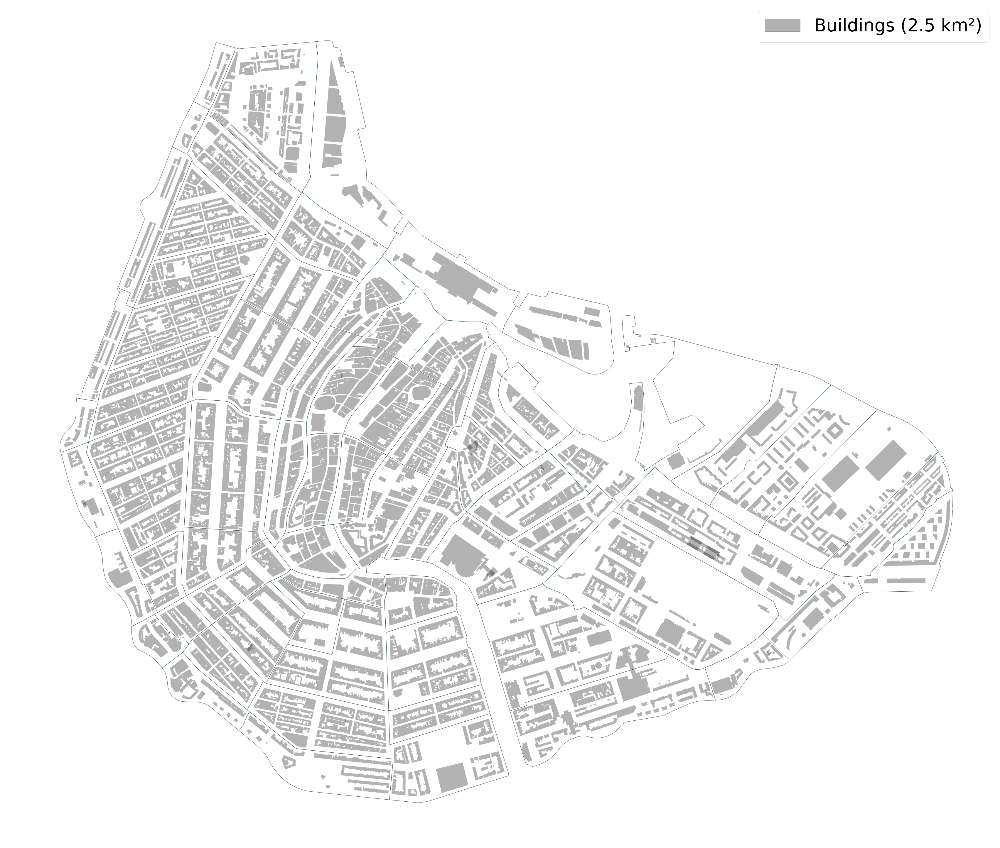

In [75]:
fig, ax = plt.subplots(1, figsize=(60, 80))

# set aspect to equal. This is done automatically
# when using *geopandas* plot on it's own, but not when
# working with pyplot directly.
ax.set_aspect('equal')

# Plot the geometries
gdf_buurt[gdf_buurt["Centrum"] == True].plot(ax=ax, color='white', edgecolor='darkslategrey', linewidth=1, facecolor='darkslategrey')
gdf_buildings[gdf_buildings["Centrum"] == True].plot(ax=ax, color='black', alpha=0.3,label='poly')

# Legend
leg_buildings = mpatches.Patch(color='black', label=f"Buildings ({b2_c/1000000:.1f} km²)", alpha=0.3)
plt.legend(handles=[leg_buildings], prop=font, fancybox=True)

# Title and axes
# plt.title('Rooftops in Amsterdam Centrum', fontsize=100, loc='left')
plt.axis('off')
plt.show();

fig.savefig("Output/Amsterdam Rooftops.png", bbox_inches='tight')
fig.savefig("Output/Amsterdam Rooftops.pdf", bbox_inches='tight')

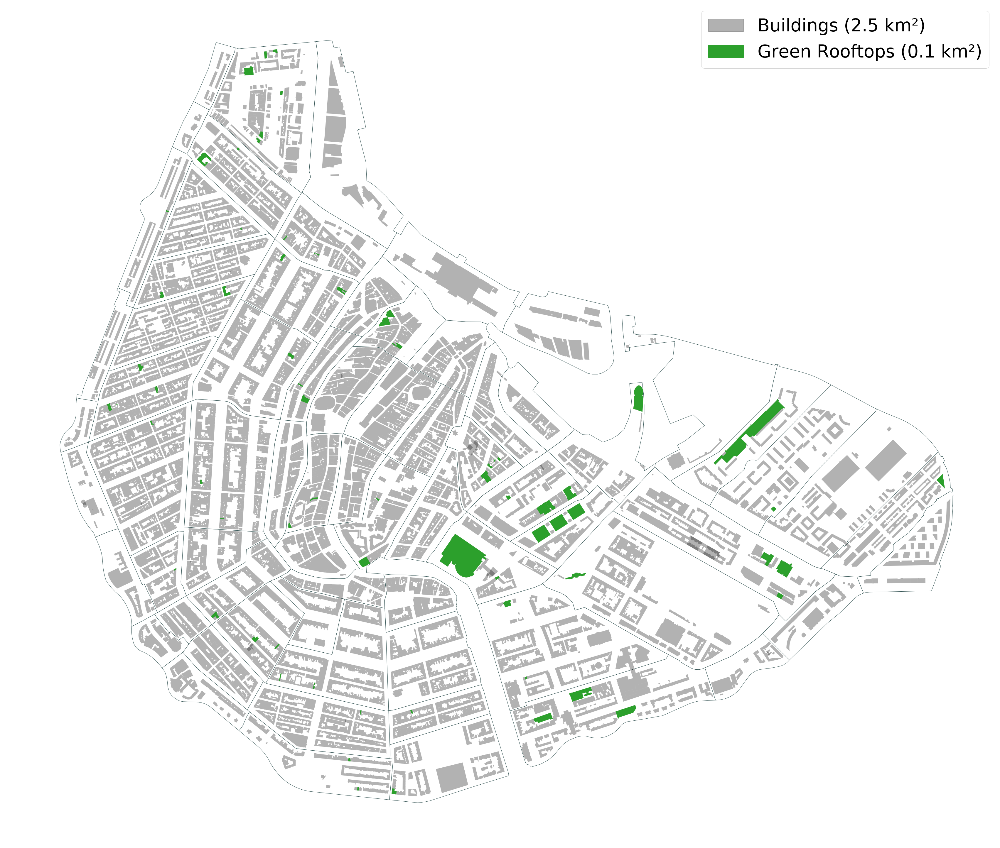

In [65]:
fig, ax = plt.subplots(1, figsize=(60, 80))

# set aspect to equal. This is done automatically
# when using *geopandas* plot on it's own, but not when
# working with pyplot directly.
ax.set_aspect('equal')

# Plot the geometries
gdf_buurt[gdf_buurt["Centrum"] == True].plot(ax=ax, color='white', edgecolor='darkslategrey', linewidth=1, facecolor='darkslategrey')
gdf_buildings[gdf_buildings["Centrum"] == True].plot(ax=ax, color='black', alpha=0.3)
gdf_buildings[(gdf_buildings["Centrum"] == True) & (gdf_buildings.greenroofs == True)].plot(ax=ax, color='#2ca02c')

# Legend
leg_buildings = mpatches.Patch(color='black', label=f"Buildings ({b2_c/1000000:.1f} km²)", alpha=0.3)
leg_gr = mpatches.Patch(color='#2ca02c', label=f"Green Rooftops ({g2_c/1000000:.1f} km²)")
plt.legend(handles=[leg_buildings, leg_gr], prop=font, fancybox=True)

# Title and axes
# plt.title('Rooftops in Amsterdam Centrum', fontsize=100, loc='left')
plt.axis('off')


plt.show();

fig.savefig("Output/Amsterdam Rooftops Green.png", bbox_inches='tight')
fig.savefig("Output/Amsterdam Rooftops Green.pdf", bbox_inches='tight')

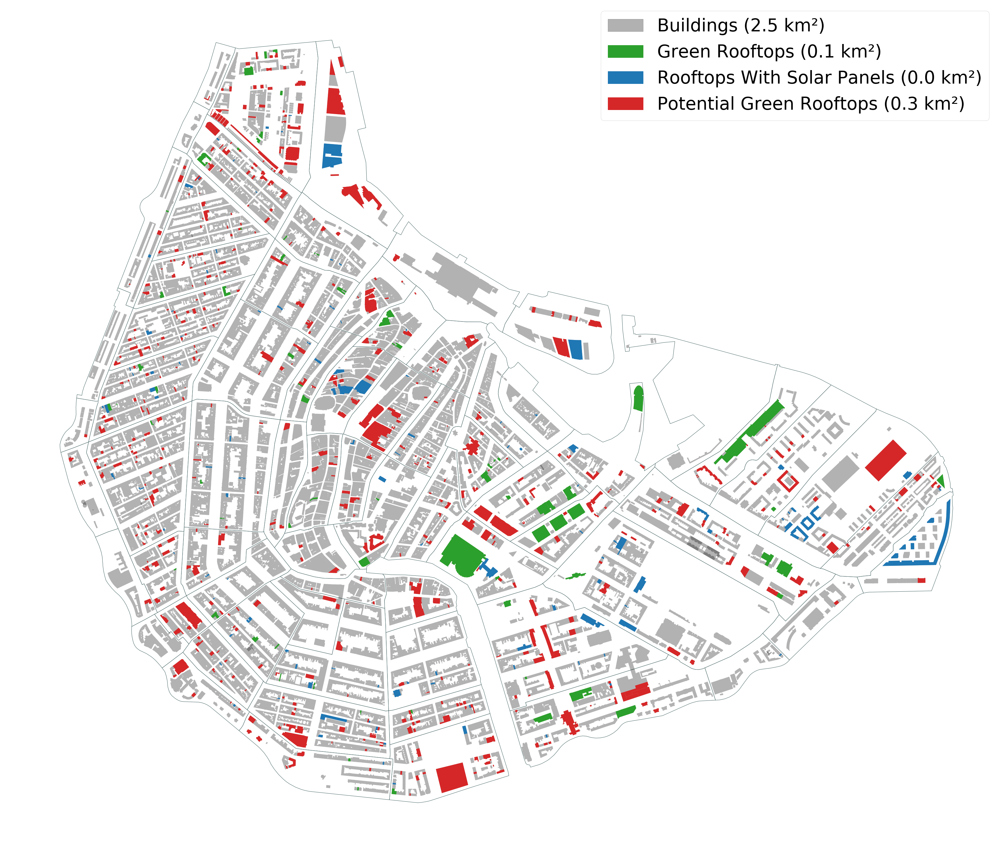

In [66]:
fig, ax = plt.subplots(1, figsize=(60, 80))

# set aspect to equal. This is done automatically
# when using *geopandas* plot on it's own, but not when
# working with pyplot directly.
ax.set_aspect('equal')

# Plot the geometries (_c means 'centrum')
gdf_buurt[gdf_buurt["Centrum"] == True].plot(ax=ax, color='white', edgecolor='darkslategrey', linewidth=1, facecolor='darkslategrey')
gdf_buildings[gdf_buildings["Centrum"] == True].plot(ax=ax, color='Black', alpha=0.3)
gdf_buildings[(gdf_buildings["Centrum"] == True) & (gdf_buildings.greenroofs == True)].plot(ax=ax, color='#2ca02c')
gdf_buildings[(gdf_buildings["Centrum"] == True) & (gdf_buildings.greenroofs != True) & 
                   (gdf_buildings.solar == 'JA')].plot(ax=ax, color='#1f77b4')
gdf_buildings[(gdf_buildings["Centrum"] == True) & (gdf_buildings.greenroofs != True) & (gdf_buildings.solar != 'JA') &
               ((gdf_buildings.monument == '0') & (gdf_buildings.build_year > 1960) &
               (gdf_buildings.slope_roof == '0'))].plot(ax=ax, color='#d62728')

# Legend
leg_buildings = mpatches.Patch(color='black', label=f"Buildings ({b2_c/1000000:.1f} km²)", alpha=0.3)
leg_gr = mpatches.Patch(color='#2ca02c', label=f"Green Rooftops ({g2_c/1000000:.1f} km²)")
leg_solar = mpatches.Patch(color='#1f77b4', label=f"Rooftops With Solar Panels ({s2_c/1000000:.1f} km²)")
leg_potential = mpatches.Patch(color='#d62728', label=f"Potential Green Rooftops ({p2_c/1000000:.1f} km²)")
plt.legend(handles=[leg_buildings, leg_gr, leg_solar, leg_potential], prop=font, fancybox=True)

# Title and axes
# plt.title('Rooftops in Amsterdam Centrum', fontsize=100, loc='left')
plt.axis('off')


plt.show();

fig.savefig("Output/Amsterdam Rooftops Potential Green.png", bbox_inches='tight')
fig.savefig("Output/Amsterdam Rooftops Potential Green.pdf", bbox_inches='tight')

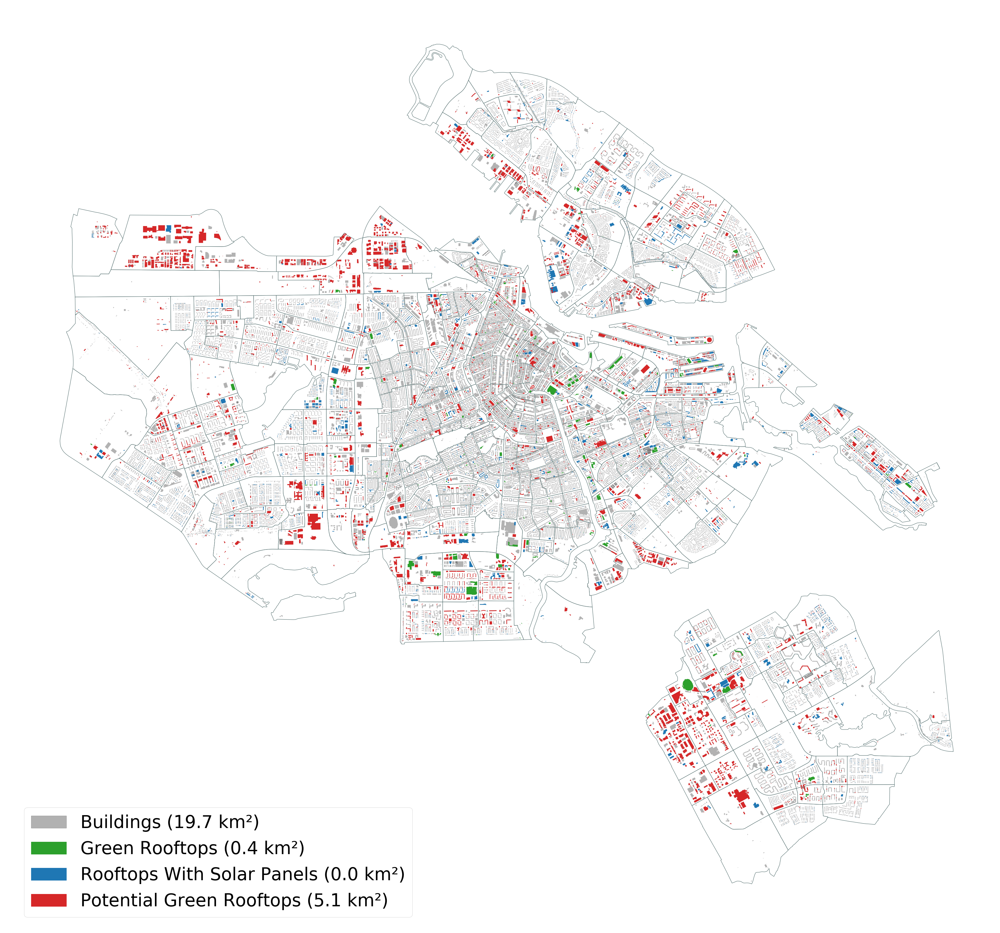

In [69]:
fig, ax = plt.subplots(1, figsize=(60, 80))

# set aspect to equal. This is done automatically
# when using *geopandas* plot on it's own, but not when
# working with pyplot directly.
ax.set_aspect('equal')

# Plot the geometries
gdf_buurt[gdf_buurt["Amsterdam"] == True].plot(ax=ax, color='white', edgecolor='darkslategrey', linewidth=1, facecolor='darkslategrey')
gdf_buildings[(gdf_buildings["Amsterdam"] == True)].plot(ax=ax, color='Black', alpha=0.3)
gdf_buildings[(gdf_buildings["Amsterdam"] == True) & (gdf_buildings.greenroofs == True)].plot(ax=ax, color='#2ca02c')
gdf_buildings[(gdf_buildings["Amsterdam"] == True) & (gdf_buildings.greenroofs != True) & (gdf_buildings.solar == 'JA')].plot(ax=ax, color='#1f77b4')
gdf_buildings[(gdf_buildings["Amsterdam"] == True) & (gdf_buildings.greenroofs != True) & (gdf_buildings.solar != 'JA') &
               ((gdf_buildings.monument == '0') & (gdf_buildings.build_year > 1960) &
               (gdf_buildings.slope_roof == '0'))].plot(ax=ax, color='#d62728')

# Legend
leg_buildings = mpatches.Patch(color='black', label=f"Buildings ({b2/1000000:.1f} km²)", alpha=0.3)
leg_gr = mpatches.Patch(color='#2ca02c', label=f"Green Rooftops ({g2/1000000:.1f} km²)")
leg_solar = mpatches.Patch(color='#1f77b4', label=f"Rooftops With Solar Panels ({s2/1000000:.1f} km²)")
leg_potential = mpatches.Patch(color='#d62728', label=f"Potential Green Rooftops ({p2/1000000:.1f} km²)")
plt.legend(handles=[leg_buildings, leg_gr, leg_solar, leg_potential], prop=font, fancybox=True, loc='lower left')

# Title and axes
# plt.title('Rooftops in Amsterdam', fontsize=100, loc='left')
plt.axis('off')

plt.show();

fig.savefig("Output/Complete Amsterdam Rooftops Potential Green.png", bbox_inches='tight')
fig.savefig("Output/Complete Amsterdam Rooftops Potential Green.pdf", bbox_inches='tight')